<h1 align="center">Facial Reconstruction using Conditional Generative Adversarial Network</h1>

## 1. Import Required Libraries 

In [1]:
import time
import os
import glob
import random

from matplotlib import pyplot as plt

import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img, img_to_array

import warnings
warnings.filterwarnings("ignore")
%matplotlib inline

2024-03-13 12:12:03.570168: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-13 12:12:03.570232: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-13 12:12:03.571886: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


## 2. Load Occlusion Dataset

In [2]:
imgs_path = glob.glob('/kaggle/input/occluded-images/occluded-images/*.jpg')

In [3]:
# print number of images
len(imgs_path)

19396

## 3. Image Visualization

In [4]:
# Function to show images 
def load_and_preprocess_image(img_path):
    img = load_img(img_path, target_size=(224, 224))  
    img_array = img_to_array(img)
    img_array = tf.expand_dims(img_array, 0)
    img_array /= 255.0  # Normalize pixel values to [0, 1]
    return img_array

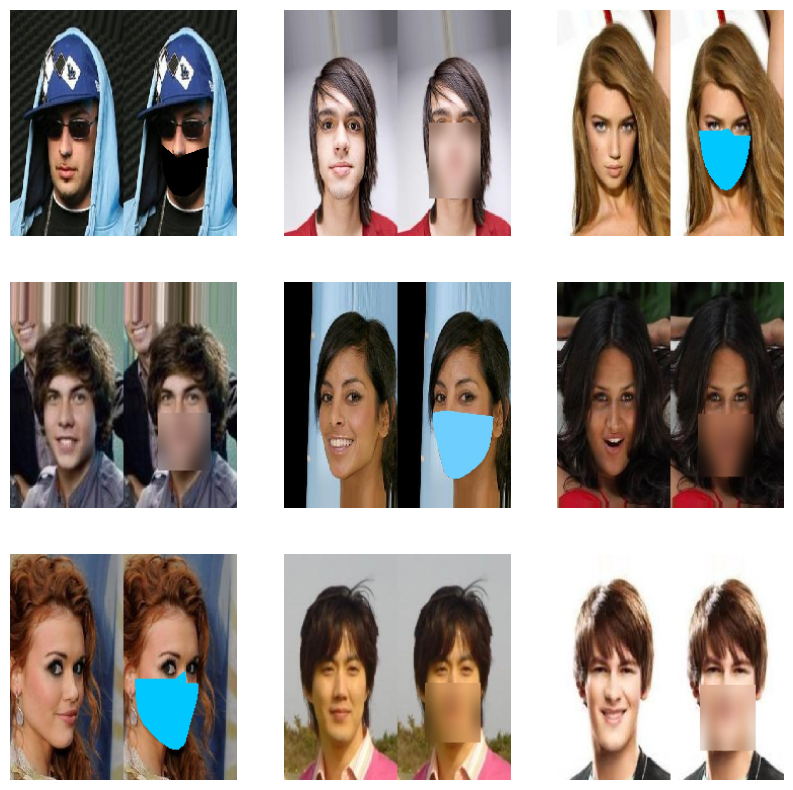

In [5]:
# Create a 5x5 grid of images
fig, axs = plt.subplots(3, 3, figsize=(10, 10))

for i in range(3):
    for j in range(3):
        random_img_path = random.choice(imgs_path)
        img_array = load_and_preprocess_image(random_img_path)
        axs[i, j].imshow(img_array[0])
        axs[i, j].axis("off")

plt.show()

## 4. Split Images into Training and Test Set

In [6]:
from sklearn.model_selection import train_test_split

In [7]:
train_img_path, test_img_path = train_test_split(imgs_path, test_size=0.2, random_state=42, shuffle=True)

In [8]:
print(f"The number of training images is {len(train_img_path)}")
print(f"The number of test images is {len(test_img_path)}")

The number of training images is 15516
The number of test images is 3880


## 5. Image Preprocessing

### 5.1. Create Train Data Pipeline

In [9]:
def read_jpg(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_jpeg(img, channels=3)
    return img

In [10]:
def normalize(input_image, input_mask):
    input_image = tf.cast(input_image, tf.float32)/127.5 - 1
    input_mask = tf.cast(input_mask, tf.float32)/127.5 - 1
    return input_image, input_mask

In [11]:
def load_image(image_path):
    image = read_jpg(image_path)
    w = tf.shape(image)[1]
    w = w // 2
    input_image = image[:, :w, :]
    input_mask = image[:, w:, :]
    input_image = tf.image.resize(input_image, (256, 256))
    input_mask = tf.image.resize(input_mask, (256, 256))
    
    if tf.random.uniform(()) > 0.5:
        input_image = tf.image.flip_left_right(input_image)
        input_mask = tf.image.flip_left_right(input_mask)

    input_image, input_mask = normalize(input_image, input_mask)

    return input_mask, input_image

In [12]:
dataset = tf.data.Dataset.from_tensor_slices(train_img_path)

In [13]:
dataset

<_TensorSliceDataset element_spec=TensorSpec(shape=(), dtype=tf.string, name=None)>

In [14]:
train = dataset.map(load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE)

In [15]:
train

<_ParallelMapDataset element_spec=(TensorSpec(shape=(256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(256, 256, 3), dtype=tf.float32, name=None))>

In [16]:
BATCH_SIZE = 32
BUFFER_SIZE = 200

In [17]:
train_dataset = train.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
train_dataset = train_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

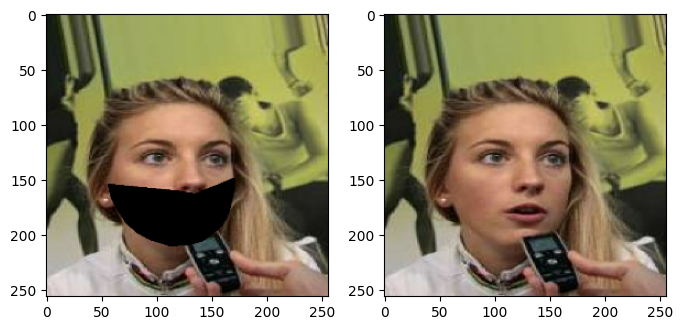

In [18]:
plt.figure(figsize=(8, 5))

for img, musk in train_dataset.take(1):
    plt.subplot(1,2,1)
    plt.imshow(tf.keras.preprocessing.image.array_to_img(img[0]))
    plt.subplot(1,2,2)
    plt.imshow(tf.keras.preprocessing.image.array_to_img(musk[0]))

### 5.2 Create Test Data Pipeline

In [19]:
dataset_test = tf.data.Dataset.from_tensor_slices(test_img_path)

In [20]:
def load_image_test(image_path):
    image = read_jpg(image_path)
    w = tf.shape(image)[1]
    w = w // 2
    input_image = image[:, :w, :]
    input_mask = image[:, w:, :]
    input_image = tf.image.resize(input_image, (256, 256))
    input_mask = tf.image.resize(input_mask, (256, 256))
    
    input_image, input_mask = normalize(input_image, input_mask)

    return input_mask, input_image

In [21]:
dataset_test = dataset_test.map(load_image_test)

In [22]:
dataset_test = dataset_test.batch(BATCH_SIZE)

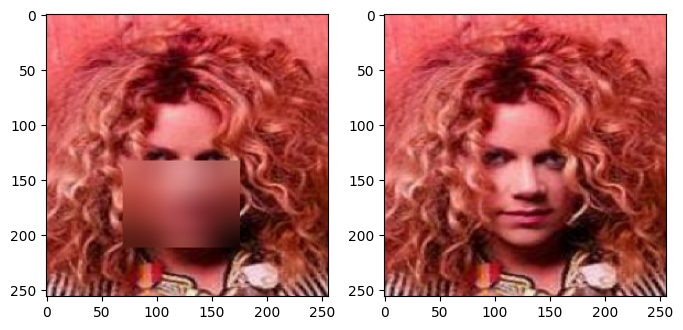

In [23]:
plt.figure(figsize=(8, 5))

for img, musk in dataset_test.take(1):
    plt.subplot(1,2,1)
    plt.imshow(tf.keras.preprocessing.image.array_to_img(img[0]))
    plt.subplot(1,2,2)
    plt.imshow(tf.keras.preprocessing.image.array_to_img(musk[0]))

## 6. Building the Generator Model

In [24]:
OUTPUT_CHANNELS = 3

In [25]:
def downsample(filters, size, apply_batchnorm=True):
#    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
        tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                               use_bias=False))

    if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())

        result.add(tf.keras.layers.LeakyReLU())

    return result

In [26]:
def upsample(filters, size, apply_dropout=False):
#    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
        tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                        padding='same',
                                        use_bias=False))

    result.add(tf.keras.layers.BatchNormalization())

    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))

    result.add(tf.keras.layers.ReLU())

    return result

### 6.1. Defining function to build the generator model

In [27]:
def Generator():
    inputs = tf.keras.layers.Input(shape=[256,256,3])

    down_stack = [
        downsample(64, 4, apply_batchnorm=False), # (bs, 128, 128, 64)
        downsample(128, 4), # (bs, 64, 64, 128)
        downsample(256, 4), # (bs, 32, 32, 256)
        downsample(512, 4), # (bs, 16, 16, 512)
        downsample(512, 4), # (bs, 8, 8, 512)
        downsample(512, 4), # (bs, 4, 4, 512)
        downsample(512, 4), # (bs, 2, 2, 512)
        downsample(512, 4), # (bs, 1, 1, 512)
    ]

    up_stack = [
        upsample(512, 4, apply_dropout=True), # (bs, 2, 2, 1024)
        upsample(512, 4, apply_dropout=True), # (bs, 4, 4, 1024)
        upsample(512, 4, apply_dropout=True), # (bs, 8, 8, 1024)
        upsample(512, 4), # (bs, 16, 16, 1024)
        upsample(256, 4), # (bs, 32, 32, 512)
        upsample(128, 4), # (bs, 64, 64, 256)
        upsample(64, 4), # (bs, 128, 128, 128)
    ]

#    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         activation='tanh') # (bs, 256, 256, 3)

    x = inputs

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = tf.keras.layers.Concatenate()([x, skip])

    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x)

**Resulting U-net model could be seen from the image below**

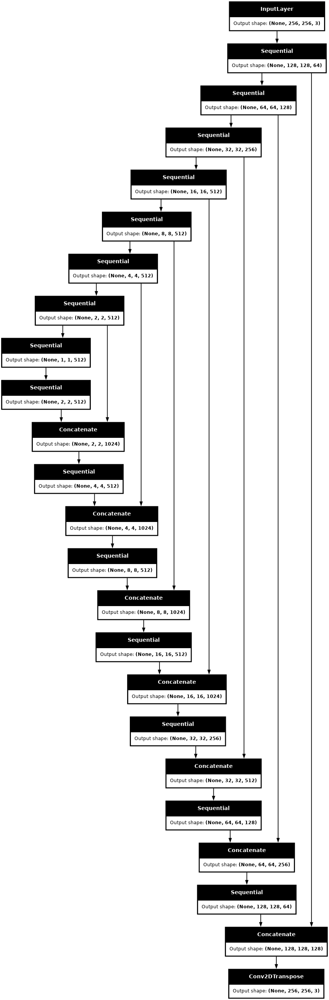

In [28]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

In [29]:
LAMBDA = 10

### 6.2. Define function for generator loss

In [30]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [31]:
def generator_loss(disc_generated_output, gen_output, target):
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

    # mean absolute error
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

    total_gen_loss = gan_loss + (LAMBDA * l1_loss)

    return total_gen_loss, gan_loss, l1_loss

## 7. Building the Discriminator Model

### 7.1. Defining function to build the discriminator model

In [32]:
def Discriminator():
#    initializer = tf.random_normal_initializer(0., 0.02)

    inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
    tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

    x = tf.keras.layers.concatenate([inp, tar]) # (bs, 256, 256, channels*2)

    down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)
    down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
    down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)

    conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                  padding='same',
                                  use_bias=False)(down3) # (bs, 32, 32, 512)

    batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

    leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

    last = tf.keras.layers.Conv2D(1, 4, strides=1, padding='same')(leaky_relu) # (bs, 30, 30, 1)

    return tf.keras.Model(inputs=[inp, tar], outputs=last)

**Resulting generator model could be seen from the image below**

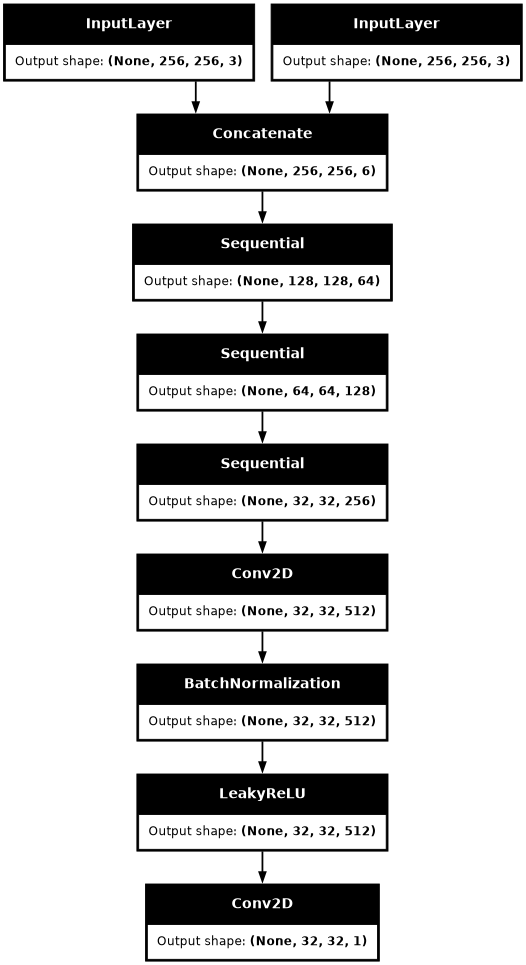

In [33]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

### 7.2. Define function for discriminator loss

In [34]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

    generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

    total_disc_loss = real_loss + generated_loss

    return total_disc_loss

## 8. Training 

### 8.1. Load Saved Generator and Discriminator if they exist

In [35]:
# Define the paths for the generator and discriminator models
gen_model_path = '/kaggle/input/generator/kaggle/working/generator.h5'
disc_model_path = '/kaggle/input/discriminator/discriminator.h5'

In [36]:
# Check if the models exist and load them, otherwise use created ones
if os.path.exists(gen_model_path) and os.path.exists(disc_model_path):
    print("Loading existing models...")
    generator = tf.keras.models.load_model(gen_model_path)
    discriminator = tf.keras.models.load_model(disc_model_path)

### 8.2. Define model optimizers 

In [37]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

### 8.3. Defining function for generating image

In [38]:
def generate_images(model, test_input, tar):
    prediction = model(test_input, training=True)
    plt.figure(figsize=(15,15))

    display_list = [test_input[0], tar[0], prediction[0]]
    title = ['Input Image', 'Ground Truth', 'Predicted Image']

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')
    plt.show()

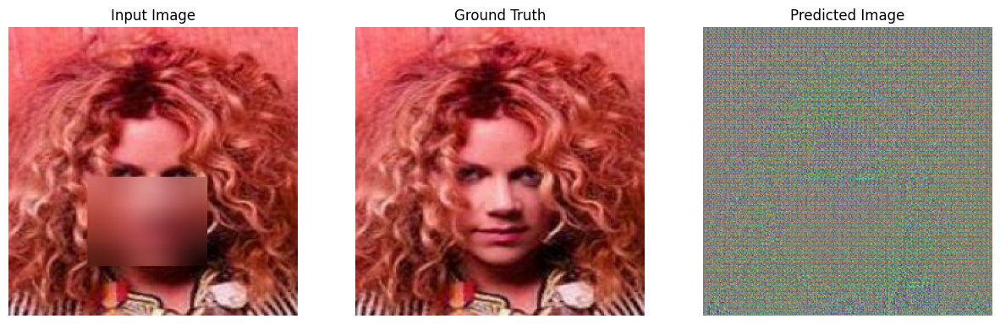

In [39]:
for example_input, example_target in dataset_test.take(1):
    generate_images(generator, example_input, example_target)

In [40]:
# We've previously trained for some epoch
EPOCHS = 5

### 8.4. Training Loop

In [41]:
@tf.function
def train_step(input_image, target, epoch):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(input_image, training=True)

        disc_real_output = discriminator([input_image, target], training=True)
        disc_generated_output = discriminator([input_image, gen_output], training=True)

        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))
    return gen_total_loss, disc_loss

In [42]:
epoch_loss_avg_gen = tf.keras.metrics.Mean('g_loss')
epoch_loss_avg_disc = tf.keras.metrics.Mean('d_loss')

In [43]:
g_loss_results = []
d_loss_results = []

In [44]:
def fit(train_ds, epochs, test_ds):
    for epoch in range(epochs+1):
        epoch_loss_avg_gen = tf.keras.metrics.Mean()
        epoch_loss_avg_disc = tf.keras.metrics.Mean()

        if epoch%2 == 0:
            for example_input, example_target in test_ds.take(1):
                generate_images(generator, example_input, example_target)
        print("Epoch: ", epoch)

        for n, (input_image, target) in train_ds.enumerate():
            print('.', end='')
            g_loss, d_loss = train_step(input_image, target, epoch)
            epoch_loss_avg_gen(g_loss)
            epoch_loss_avg_disc(d_loss)
        print()
        g_loss_results.append(epoch_loss_avg_gen.result())
        d_loss_results.append(epoch_loss_avg_disc.result())


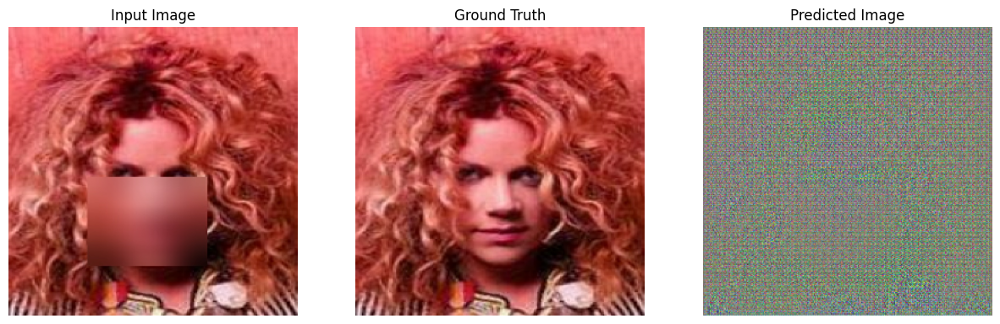

Epoch:  0
.

2024-03-13 12:12:36.531400: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infunctional_16_1/sequential_8_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


.....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

2024-03-13 12:30:52.557828: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infunctional_16_1/sequential_8_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


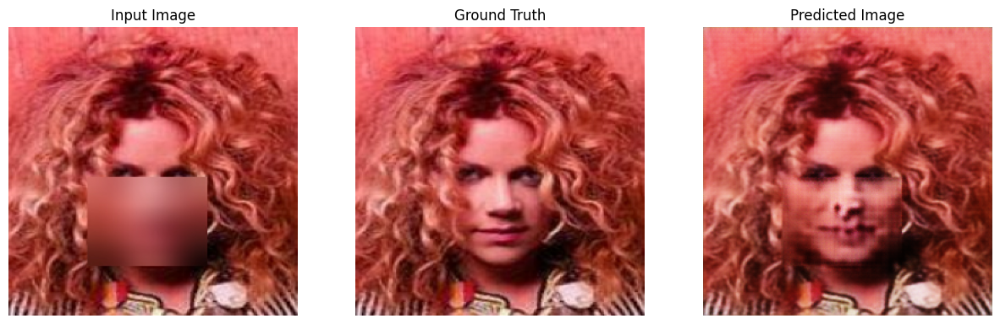

Epoch:  2
.....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

2024-03-13 12:39:45.695588: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infunctional_16_1/sequential_8_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer



Epoch:  3
.....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

2024-03-13 12:48:37.342398: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infunctional_16_1/sequential_8_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


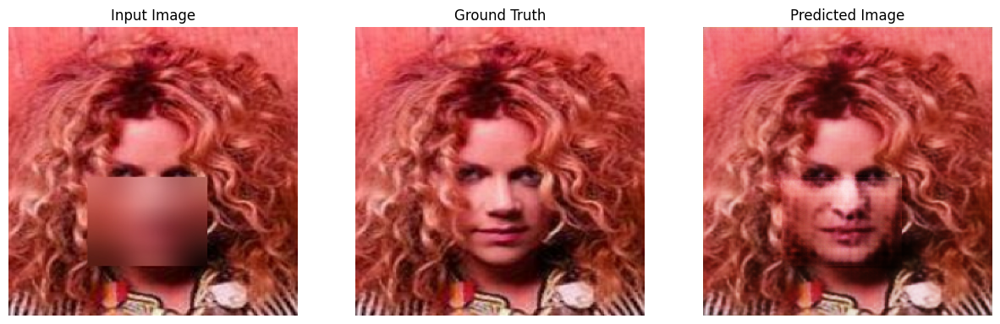

Epoch:  4
.....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

2024-03-13 12:57:30.552746: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infunctional_16_1/sequential_8_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer



Epoch:  5
.....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

2024-03-13 13:06:23.325579: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infunctional_16_1/sequential_8_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer



.........................................................................................................................

KeyboardInterrupt: 

In [45]:
fit(train_dataset, EPOCHS, dataset_test)

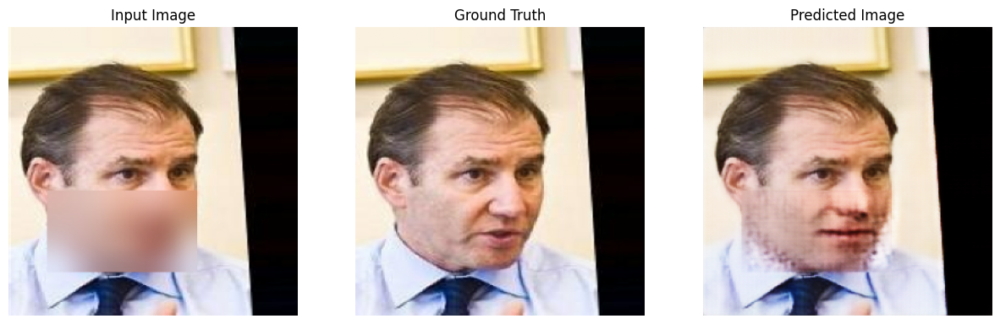

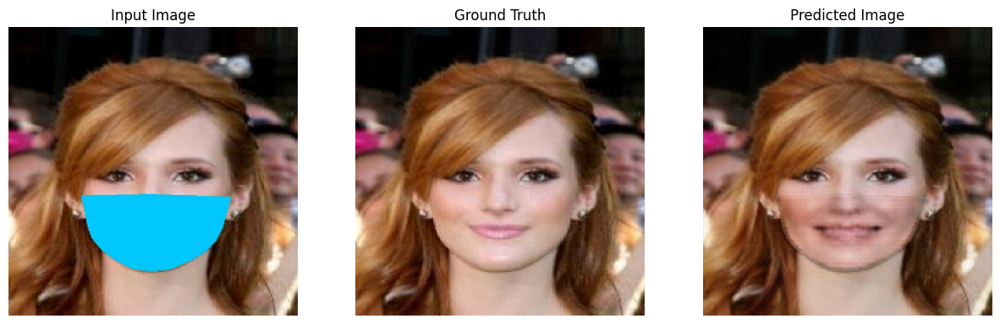

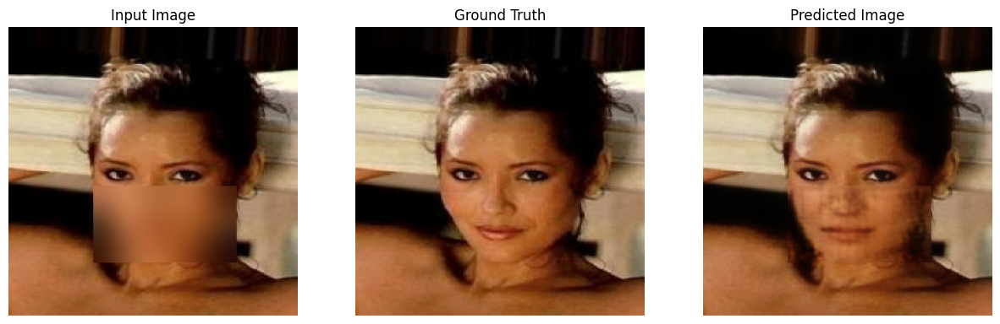

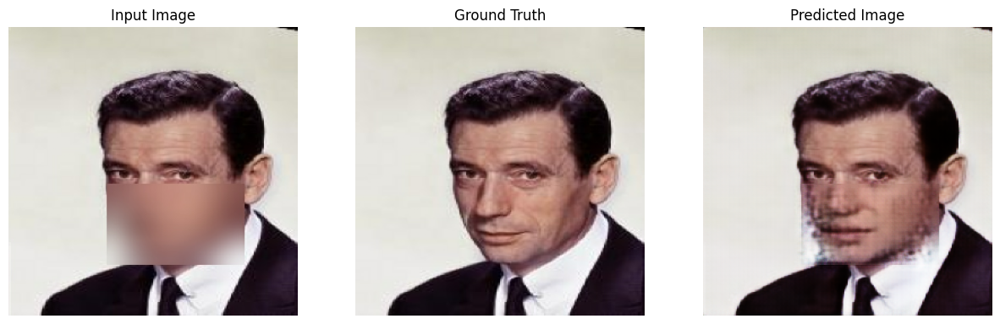

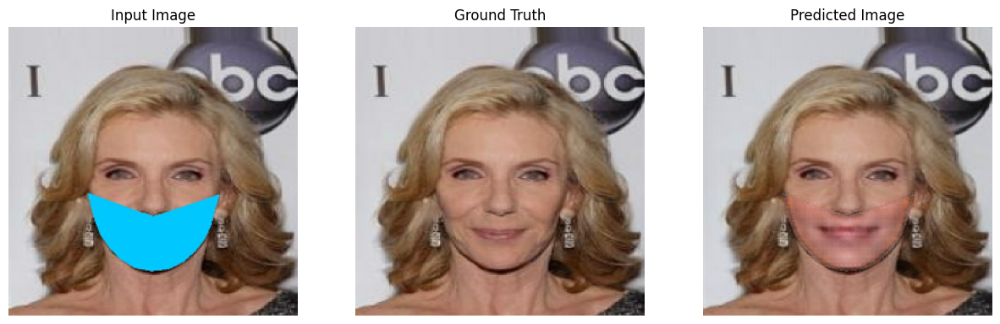

...

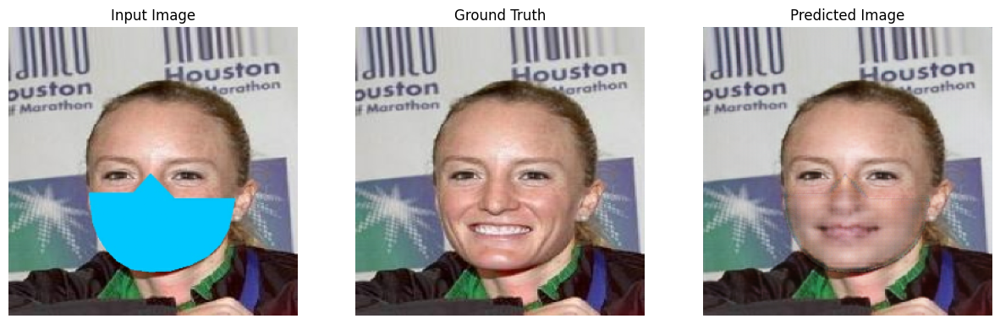

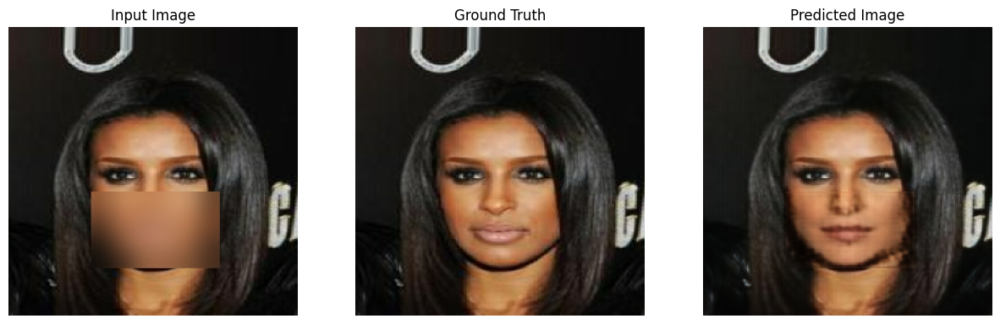

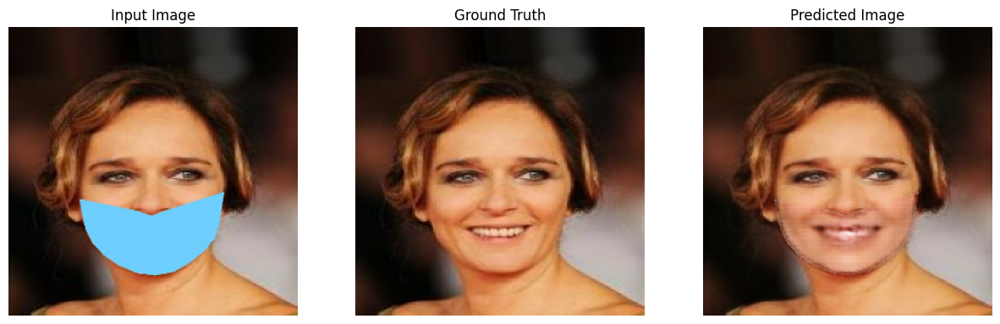

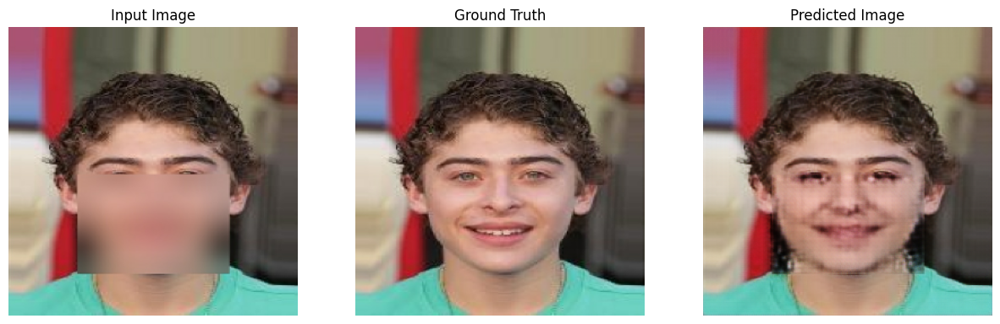

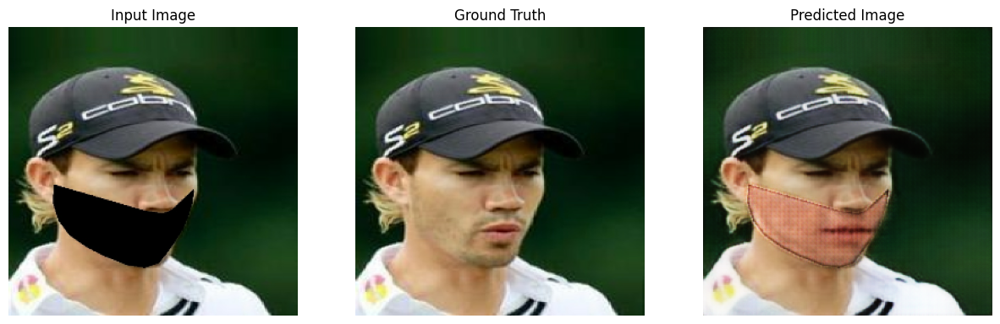

In [46]:
for n, data in enumerate(dataset_test):
    if(n>35 and n<50):
        sketch_image = data[0]
        ground_truth = data[1]
        generate_images(generator, sketch_image, ground_truth)
    elif (n>50):
        break

## 9. Save Model

In [47]:
import zipfile
from IPython.display import FileLink

In [48]:
generator.save('generator.h5')
discriminator.save('discriminator.h5')

In [49]:
file_name = "/kaggle/working/generator.h5"
zipfile_name = "generator.zip"

# file_name = "/kaggle/working/discrimator.h5"
# zipfile_name = "generator.zip"

In [50]:
# create a ZipFile object
with zipfile.ZipFile(zipfile_name, 'w') as zipf:
    # add file to the zip file
    zipf.write(file_name)

# create a download link
link = FileLink(zipfile_name)

# display the link
display(link)

/kaggle/working/generator.zip